<h1><center> </center></h1>

In [1]:
# import python packages
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy as cy
from matplotlib.dates import DateFormatter
import cartopy.crs as ccrs 
import cmocean
import netCDF4 as nc
import glob as glob
import pandas as pd
# SOFI
#import SWOT_Oceanography_Functions_Ingvild as sofi
#import SWOT_PLOT_Step_2_Func as plt_s2
#import SWOT_Step_2_make_files as step_2
#import SOFiA as SOFiA
from numpy import linalg as LA
# Binning (Jonathan)
from scipy.stats import binned_statistic_2d
import cartopy.feature as cfeature
import cmcrameri as cmc

from scipy.ndimage import gaussian_filter, gaussian_laplace, fourier_gaussian

### Create files

In [ ]:
''' FUNCTIONS TO MOVE 8 POINT :                                                                                    '''
# RIGHT : 
def move_right(data):
    data_right = np.zeros((data.shape[0], data.shape[1]+1))
    data_right[:, 1:] = data
    data_right[:, 0]  = np.nan
    data_right = data_right[:, :-1]
    return data_right
# LEFT : 
def move_left(data):
    data_left = np.zeros((data.shape[0], data.shape[1]+1))
    data_left[:, :-1] = data
    data_left[:, -1]  = np.nan
    data_left = data_left[:, 1:]
    return data_left
# DOWN : 
def move_down(data):
    data_down = np.zeros((data.shape[0]+1, data.shape[1]))
    data_down[1:, :] = data
    data_down[0, :]  = np.nan
    data_down = data_down[:-1, :]
    return data_down
# UP :
def move_up(data):
    move_up = np.zeros((data.shape[0]+1, data.shape[1]))
    move_up[:-1, :] = data
    move_up[-1, :]  = np.nan
    move_up = move_up[1:, :]
    return move_up
# UP LEFT : 
def move_up_left(data):
    data_up      = move_up(data)
    data_up_left = move_left(data_up)
    return data_up_left
# UP RIGHT :
def move_up_right(data):
    data_up       = move_up(data)
    data_up_right = move_right(data_up)
    return data_up_right
# DOWN LEFT : 
def move_down_left(data):
    data_down      = move_down(data)
    data_down_left = move_left(data_down)
    return data_down_left
# DOWN RIGHT : 
def move_down_right(data):
    data_down       = move_down(data)
    data_down_right = move_right(data_down)
    return data_down_right
''' 9 POINT SMOOTHING FUNCTION :                                                                                   '''
def smooth_9_point(data):
    data_right      = move_right(data)
    data_left       = move_left(data)
    data_up         = move_up(data)
    data_down       = move_down(data)
    data_up_right   = move_up_right(data)
    data_up_left    = move_up_left(data)
    data_down_right = move_down_right(data)
    data_down_left  = move_down_left(data)
    # np.array([data, data_right, data_left, data_up, data_down, data_up_right, 
    # data_up_left, data_down_right, data_down_left])
    data_all = ([data, data_right, data_left, data_up, data_down, data_up_right, 
                 data_up_left, data_down_right, data_down_left])
    data_all_mean = np.nanmean(data_all, axis=0)
    return data_all_mean
''' SMOOTH MULTIPLE TIMES :                                                                                        '''
def smooth_multiple_times(data, times):
    for i in range(times):
        data = smooth_9_point(data)
    return data
''' CLEANER FUNCTION :                                                                                             '''
# CELAN EDGES AND MIDDEL :
def clean_smoothing(data, orig_data):
    # Make mask for nan in orig-data :
    #nan_df         = np.isnan(orig_data)#.isna()
    orig_data      = pd.DataFrame(orig_data)
    nan_df         = orig_data.isna()
    clean_data_msk = np.ma.masked_where(nan_df, data)
    clean_data     = np.ma.filled(clean_data_msk, np.nan)
    # CLEAN EDGES :
    #clean_data = clean_data[1:-1,1:-1]
    return clean_data
''' TEST THE FUNCTIONS ABOVE WITH A TEST FUNCTION :                                                                '''
def test_smooth_9_point():
    # TEST DATA :
    test_data = np.array([[1, 2, np.nan, 4], [5, 6, 7, 8], [9, 10, 11, 12], [13, 14, 15, 16]])
    # TEST SMOOTHING :
    data_right      = move_right(test_data)
    data_left       = move_left(test_data)
    data_up         = move_up(test_data)
    data_down       = move_down(test_data)
    data_up_right   = move_up_right(test_data)
    data_up_left    = move_up_left(test_data)
    data_down_right = move_down_right(test_data)
    data_down_left  = move_down_left(test_data)
    # PRINT RESULTS :
    print('test data')
    print(test_data)
    print('right')
    print(data_right)
    print('left')
    print(data_left)
    print('up')
    print(data_up)
    print('down')
    print(data_down)
    print('up_right')
    print(data_up_right)
    print('up_left')
    print(data_up_left)
    print('down_right')
    print(data_down_right)
    print('down_left')
    print(data_down_left)
    # SMOOTHING :
    smoothed_data = smooth_9_point(test_data)
    print('smoothed data')
    print(smoothed_data)
    # CLEAN DATA :
    cleaned_data = clean_smoothing(smoothed_data, test_data)
    print('cleaned data')
    print(cleaned_data)
''' FUNCTION TO GET THE YEAR, MONTH AND DAY OF THE CYCLE : '''
def finding_year_month_day_of_cycle(dataset_merged, cycle_number, int_or_str):
    ''' FINDING THE YEAR, MONTH AND DAY OF THE CYCLE : '''
    name_of_all_cycles = dataset_merged.concat_dim.data
    name_of_cycle      = name_of_all_cycles[cycle_number]
    # Find the year, month and day of the cycle :
    year_str  = name_of_cycle[13:17]
    month_str = name_of_cycle[17:19]
    day_str   = name_of_cycle[19:21]
    # Convert the strings to integers :
    year_int  = int(year_str)
    month_int = int(month_str)
    day_int   = int(day_str)
    ''' RETURN THE YEAR, MONTH AND DAY OF THE CYCLE : '''
    if int_or_str == 'str':
        return year_str, month_str, day_str
    elif int_or_str == 'int':
        return year_int, month_int, day_int
''' FUNCTION TO FIND THE SEASON OF THE CYCLE : '''
def find_season_of_cycle(dataset_merged):
    ''' FIRST FIND THE LENGTH OF THE DATASET (NUMBER OF CYCLES) : '''
    num_cycles = len(dataset_merged.concat_dim.data)
    ''' FINDING THE MONTH OF THE CYCLE : '''
    month_list = []
    for i in range(num_cycles):
        year, month, day = finding_year_month_day_of_cycle(dataset_merged, i, 'int')
        month_list.append(month)
    ''' FINDING THE SEASON OF THE CYCLE : '''
    DJF = []
    MAM = []
    JJA = []
    SON = []
    for j,k in zip(month_list, range(len(month_list))):
        if j == 12 or j == 1 or j == 2:
            DJF.append(k)
        elif j == 3 or j == 4 or j == 5:
            MAM.append(k)
        elif j == 6 or j == 7 or j == 8:
            JJA.append(k)
        elif j == 9 or j == 10 or j == 11:
            SON.append(k)
    Winter = []
    Summer = []
    for l,m in zip(month_list, range(len(month_list))):
        if l ==11 or l == 12 or l == 1 or l == 2:
            Winter.append(m)
        elif l == 5 or l == 6 or l == 7 or l == 8:
            Summer.append(m)
    return month_list, DJF, MAM, JJA, SON, Winter, Summer
def find_season_of_cycle_new(dataset_merged):
    ''' FIRST FIND THE LENGTH OF THE DATASET (NUMBER OF CYCLES) : '''
    num_cycles = len(dataset_merged.concat_dim.data)
    ''' FINDING THE MONTH OF THE CYCLE : '''
    month_list = []
    year_list  = []
    for i in range(num_cycles):
        year, month, day = finding_year_month_day_of_cycle(dataset_merged, i, 'int')
        month_list.append(month)
        year_list.append(year)
    ''' FINDING THE SEASON OF THE CYCLE : '''
    # Winter is Dec, Jan, Feb, Mar [12, 1, 2, 3]
    # Summer is Jun, Jul, Aug, Sep [ 6, 7, 8, 9]
    Winter_24 = []
    Winter_25 = []
    Summer_24 = []
    for j,k, y in zip(month_list, range(len(month_list)), year_list):
        if (j == 12 and y == 2023) or (j == 1 and y == 2024) or (j == 2 and y == 2024) or (j == 3 and y == 2024):
            Winter_24.append(k)
        elif (j == 12 and y == 2024) or (j == 1 and y == 2025) or (j == 2 and y == 2025) or (j == 3 and y == 2025):
            Winter_25.append(k)
        elif (j == 6 and y == 2024) or (j == 7 and y == 2024) or (j == 8 and y == 2024) or (j == 9 and y == 2024):
            Summer_24.append(k)
    return month_list, year_list, Winter_24, Winter_25, Summer_24
''' FUNCTION TO CONCATENATE THE SMOOTHED FILES : '''
# NB! ASSUMES MASKED AND CORRECTED BEFORE !
def concat_files_smoothed(merged_dataset, merged_masked_dataset, times_smooth):
    # Define lines and pixel number : 
    num_lines  = len(merged_dataset['num_lines'])
    num_pixels = len(merged_dataset['num_pixels'])
    print(f'num_lines:{num_lines} , num_pixels:{num_pixels}')
    # Initialize the new dimension name :
    filenamedim = []
    files = {}
    # The number of files to concatenate :
    len_files = len(merged_dataset['concat_dim'])
    print(f'nr of cycles: {len_files}')
    for i in range(len_files):
        # Keep track of the pass and day :
        name_now = merged_dataset['concat_dim'][i].data
        print('Working on ' + name_now)
        cycle_ds = merged_masked_dataset[i]
        # Smooth each cycle separate
        smoothed_one_cycle = smooth_multiple_times(cycle_ds, times_smooth)
        cleaned_one_cycle  = clean_smoothing(smoothed_one_cycle, cycle_ds)
        # Store ass DataArray
        files[i] = xr.DataArray(cleaned_one_cycle, dims=('num_lines', 'num_pixels'), coords={'num_lines': np.arange(num_lines), 'num_pixels': np.arange(num_pixels)})
        filenamedim.append(name_now) 
    # Concatenating the files : (meanings that the files are concatenated along the new dimension)
    concated_files = xr.concat([(files[a]) for a in range(len_files)], dim =filenamedim) 
    return concated_files
''' FUNCTION TO GET CORRECTED AND VARIABLES, LAT, LON, SEASON-INFORMATION : '''
# Per now, can only smooth one cycle at time, need to fix or dont use smooth ?

def get_corrected_and_masked_variables_C0_C2_all_own_ssha(merged_dataset, var_type, correction_type, mask_type, smoothing):
    # Initialize variables
    corrected = None
    ''' CORRECT THE VARIABLES : '''
    if correction_type == 'ssh':
       corrected = merged_dataset[var_type]  + merged_dataset['height_cor_xover'] - merged_dataset['geoid']
    elif correction_type == 'ssha':
        corrected = merged_dataset[var_type] + merged_dataset['height_cor_xover']
    elif correction_type == 'ssh_tide':
        corrected = merged_dataset[var_type] + merged_dataset['height_cor_xover'] - merged_dataset['geoid'] - merged_dataset['solid_earth_tide'] - merged_dataset['ocean_tide_fes'] - merged_dataset['ocean_tide_non_eq'] - merged_dataset['internal_tide_hret'] - merged_dataset['pole_tide'] - merged_dataset['dac']
    elif correction_type == 'ssha_own':
        corrected = merged_dataset[var_type] + merged_dataset['height_cor_xover'] - merged_dataset['mean_sea_surface_cnescls'] - merged_dataset['solid_earth_tide'] - merged_dataset['ocean_tide_fes'] - merged_dataset['ocean_tide_non_eq'] - merged_dataset['internal_tide_hret'] - merged_dataset['pole_tide'] - merged_dataset['dac']
    ''' MASK THE VARIABLES : '''
    if mask_type == 'qual_flag':
        good_data = merged_dataset[var_type+'_qual'] > 0
        # Apply the mask :
        masked_1 = np.ma.masked_where(good_data, corrected)
        masked   = np.ma.filled(masked_1, np.nan)
    elif mask_type == 'height_and_qual_flag':
        good_data1  = merged_dataset[var_type+'_qual'] > 0
        good_data2  = merged_dataset['height_cor_xover_qual'] > 0
        # Apply the mask :
        masked_1 = np.ma.masked_where(good_data1, corrected)
        masked_2 = np.ma.masked_where(good_data2, masked_1)
        masked   = np.ma.filled(masked_2, np.nan)
    elif mask_type == 'all':
        good_data1 = merged_dataset[var_type+'_qual'] > 0
        good_data2 = merged_dataset['height_cor_xover_qual'] > 0
        #good_data3 = merged_dataset['ancillary_surface_classification_flag'] > 1
        good_data3 = merged_dataset['ancillary_surface_classification_flag'] > 0
        good_data4 = merged_dataset['dynamic_ice_flag'] > 0
        good_data5 = merged_dataset['ice_conc']>30
        # Apply the mask :
        masked_1 = np.ma.masked_where(good_data1, corrected)
        masked_2 = np.ma.masked_where(good_data2, masked_1)
        masked_3 = np.ma.masked_where(good_data3, masked_2)
        masked_4 = np.ma.masked_where(good_data4, masked_3)
        masked_5 = np.ma.masked_where(good_data5, masked_4)
        masked   = np.ma.filled(masked_5, np.nan)
    ''' SMOOTH IF WANTED : '''
    if smoothing == None:
        masked_d = masked
        #month_list, DJF, MAM, JJA, SON, Winter, Summer = find_season_of_cycle(merged_dataset)
    else:
        concated_files = concat_files_smoothed(merged_dataset, masked, times_smooth=smoothing)
        masked_d = concated_files
        #month_list, DJF, MAM, JJA, SON, Winter, Summer = find_season_of_cycle(merged_dataset)
    ''' GET THE LATITUDE AND LONGITUDE : '''
    lat = corrected.latitude.data
    lon = corrected.longitude.data
    #lat = merged_dataset.latitude.data
    #lon = merged_dataset.longitude.data
    ''' GET THE SEASON INFORMATION : '''
    month_list, year_list, Winter_24, Winter_25, Summer_24 = find_season_of_cycle_new(merged_dataset)
    ''' RETURN THE MASKED VARIABLE : '''
    return masked_d, lat, lon, month_list, year_list, Winter_24, Winter_25, Summer_24

In [ ]:
def calculate_ug_vg(masked_dataset, lat, lon):
    ''' GET SLA_DX AND SLA_DY : '''
    sla_diff_x = np.gradient(masked_dataset, axis=2)
    sla_diff_y = np.gradient(masked_dataset, axis=1)
    ''' dx, dy : '''
    dx = 2000
    dy = 2000
    ''' Tetha, g, f : '''
    tetha = np.deg2rad(lat)
    g     = 9.81
    f     = 2 * 7.2921e-5 * np.sin(tetha)
    ''' ug, vg : '''
    ug  = - (g / f) * (sla_diff_y / dy)
    vg  =   (g / f) * (sla_diff_x / dx)
    ''' RETURN UG AND VG : '''
    return ug, vg
def rotate_dataset_original_grid_all_cycles(lat, lon, u, v):
    TETHA = lon
    PHI   = lat
    num_lines  = PHI.shape[0]
    num_pixels = PHI.shape[1]
    TETHA      = np.where(TETHA > 180, TETHA - 360, TETHA)
    # because num_lines is y and num_pixels is x
    delta_PHI        = np.diff(PHI,   axis=1)
    delta_TETHA      = np.diff(TETHA, axis=1)
    delta_PHI        = np.append(delta_PHI, np.zeros((num_lines, 1)), axis=1)
    delta_TETHA      = np.append(delta_TETHA, np.zeros((num_lines, 1)), axis=1)
    tetha_rad        = np.deg2rad(TETHA)
    phi_rad          = np.deg2rad(PHI)
    delta_tetha_rad  = np.deg2rad(delta_TETHA)
    delta_phi_rad    = np.deg2rad(delta_PHI)
    cos_PHI          = np.cos(phi_rad)
    curly_TETHA      = np.arctan2(delta_phi_rad,cos_PHI*delta_tetha_rad)
    u_rotated        = u*np.cos(curly_TETHA) - v*np.sin(curly_TETHA)
    v_rotated        = u*np.sin(curly_TETHA) + v*np.cos(curly_TETHA)
    u_rotated_by_phi = u_rotated/cos_PHI
    return u_rotated, v_rotated

In [ ]:
def correct_and_maske_vari_C0_C2_all_own_ssha(merged_dataset, smoothing):
    ''' SSH : corrected for tides, dac, and geoid : '''
    SSH_karin_2_corr = merged_dataset['ssh_karin_2'] + merged_dataset['height_cor_xover'] - merged_dataset['geoid'] - merged_dataset['solid_earth_tide'] - merged_dataset['ocean_tide_fes'] - merged_dataset['ocean_tide_non_eq'] - merged_dataset['internal_tide_hret'] - merged_dataset['pole_tide'] - merged_dataset['dac']
    ''' SSHA : created from equations, but C0 do not remove ocean_tide_non_eq : '''
    SSHA_karin_2_own = merged_dataset['ssh_karin_2'] + merged_dataset['height_cor_xover'] - merged_dataset['mean_sea_surface_cnescls'] - merged_dataset['solid_earth_tide'] - merged_dataset['ocean_tide_fes'] - merged_dataset['ocean_tide_non_eq'] - merged_dataset['internal_tide_hret'] - merged_dataset['pole_tide'] - merged_dataset['dac']
    ''' MASK THEM : '''
    good_data1 = merged_dataset['ssh_karin_2_qual'] > 0
    good_data2 = merged_dataset['height_cor_xover_qual'] > 0
    #good_data3 = merged_dataset['ancillary_surface_classification_flag'] > 1
    good_data3 = merged_dataset['ancillary_surface_classification_flag'] > 0
    good_data4 = merged_dataset['dynamic_ice_flag'] > 0
    good_data5 = merged_dataset['ice_conc']>30
    # Apply the mask :
    SSH_karin_2_corr_masked_1 = np.ma.masked_where(good_data1, SSH_karin_2_corr)
    SSH_karin_2_corr_masked_2 = np.ma.masked_where(good_data2, SSH_karin_2_corr_masked_1)
    SSH_karin_2_corr_masked_3 = np.ma.masked_where(good_data3, SSH_karin_2_corr_masked_2)
    SSH_karin_2_corr_masked_4 = np.ma.masked_where(good_data4, SSH_karin_2_corr_masked_3)
    SSH_karin_2_corr_masked_5 = np.ma.masked_where(good_data5, SSH_karin_2_corr_masked_4)
    SSH_karin_2_corr_masked   = np.ma.filled(SSH_karin_2_corr_masked_5, np.nan)
    SSHA_karin_2_own_masked_1 = np.ma.masked_where(good_data1, SSHA_karin_2_own)
    SSHA_karin_2_own_masked_2 = np.ma.masked_where(good_data2, SSHA_karin_2_own_masked_1)
    SSHA_karin_2_own_masked_3 = np.ma.masked_where(good_data3, SSHA_karin_2_own_masked_2)
    SSHA_karin_2_own_masked_4 = np.ma.masked_where(good_data4, SSHA_karin_2_own_masked_3)
    SSHA_karin_2_own_masked_5 = np.ma.masked_where(good_data5, SSHA_karin_2_own_masked_4)
    SSHA_karin_2_own_masked   = np.ma.filled(SSHA_karin_2_own_masked_5, np.nan)
    ''' SSHA : removed internal mean also : '''
    SSHA_karin_2_own_mean = np.nanmean(SSHA_karin_2_own_masked, axis=0)
    SSHA_karin_2_int = SSHA_karin_2_own_masked - SSHA_karin_2_own_mean
    ''' SMOOTH IF WANTED : '''
    if smoothing == None:
        SSH_cor_msk   = SSH_karin_2_corr_masked
        SSHA_cor_msk  = SSHA_karin_2_own_masked
        SSHAI_cor_msk = SSHA_karin_2_int
    else:
        SSH_cor_msk   = concat_files_smoothed(merged_dataset, SSH_karin_2_corr_masked, times_smooth=smoothing)
        SSHA_cor_msk  = concat_files_smoothed(merged_dataset, SSHA_karin_2_own_masked, times_smooth=smoothing)
        SSHAI_cor_msk = concat_files_smoothed(merged_dataset, SSHA_karin_2_int, times_smooth=smoothing)
    ''' GET THE LATITUDE AND LONGITUDE : '''
    lat = merged_dataset['latitude'].data#SSH_karin_2_corr.latitude#.data
    lon = merged_dataset['longitude'].data#SSH_karin_2_corr.longitude#.data
    ''' Fix the Longitude : '''
    new_lon = np.where(lon > 180, lon - 360, lon)
    lat2 = np.repeat(lat[np.newaxis,:,:], SSH_cor_msk.shape[0], axis=0)
    new_lon2 = np.repeat(new_lon[np.newaxis,:,:], SSH_cor_msk.shape[0], axis=0)
    ''' GET THE SEASON INFORMATION : '''
    month_list, year_list, Winter_24, Winter_25, Summer_24 = find_season_of_cycle_new(merged_dataset)
    concat_dim_nm = merged_dataset['concat_dim'].data
    ''' RETURN THE MASKED VARIABLE : '''
    return lat2, new_lon2, month_list, year_list, Winter_24, Summer_24, SSH_cor_msk, SSHA_cor_msk, SSHAI_cor_msk, concat_dim_nm

def make_NetCDF(path_merged,pass_nr,smoothing):
    ''' OPEN DS : '''
    ds = xr.open_dataset(path_merged+pass_nr+'.nc')
    ''' GET VARIABLES : '''
    #lat, new_lon, month_list, year_list, Winter_24, Summer_24, SSH_cor_msk_2, SSHA_cor_msk_2, SSHAI_cor_msk_2, concat_dim_nm = correct_and_maske_vari_C0_C2_all_own_ssha(ds, smoothing)
    lat, new_lon, month_list, year_list, Winter_24, Summer_24, SSH_cor_msk, SSHA_cor_msk, SSHAI_cor_msk, concat_dim_nm       = correct_and_maske_vari_C0_C2_all_own_ssha(ds, smoothing)
    ''' CALCULATE UG AND VG : '''
    ug_SSH,   vg_SSH   = calculate_ug_vg(SSH_cor_msk, lat, new_lon)
    ug_SSHA,  vg_SSHA  = calculate_ug_vg(SSHA_cor_msk, lat, new_lon)
    ug_SSHAI, vg_SSHAI = calculate_ug_vg(SSHAI_cor_msk, lat, new_lon)
    ''' MEAN OF ug AND vg : '''
    #ug_mean = np.nanmean(ug, axis=0)
    #vg_mean = np.nanmean(vg, axis=0)
    ''' ROTATE TO ZONAL AND MERIDIONAL : '''
    ug_rot_SSH,   vg_rot_SSH   = rotate_dataset_original_grid_all_cycles(lat[0], new_lon[0], ug_SSH, vg_SSH)
    ug_rot_SSHA,  vg_rot_SSHA  = rotate_dataset_original_grid_all_cycles(lat[0], new_lon[0], ug_SSHA, vg_SSHA)
    ug_rot_SSHAI, vg_rot_SSHAI = rotate_dataset_original_grid_all_cycles(lat[0], new_lon[0], ug_SSHAI, vg_SSHAI)
    ''' SPEED : '''
    speed_SSH   = np.sqrt(ug_rot_SSH**2   + vg_rot_SSH**2)
    speed_SSHA  = np.sqrt(ug_rot_SSHA**2  + vg_rot_SSHA**2)
    speed_SSHAI = np.sqrt(ug_rot_SSHAI**2 + vg_rot_SSHAI**2)
    ''' Num_lines, Num_pixels '''
    num_lines    = SSHA_cor_msk.shape[1]
    num_pixels   = SSHA_cor_msk.shape[2]
    concat_dim   = SSHA_cor_msk.shape[0]
    concat_dim_n = concat_dim_nm
    ''' CREATE DataArrays '''
    SSH_c           = xr.DataArray(SSH_cor_msk,   dims=('concat_dim', 'num_lines', 'num_pixels'), coords={'concat_dim': concat_dim_n, 'num_lines': np.arange(num_lines), 'num_pixels': np.arange(num_pixels)})
    SSHA_c          = xr.DataArray(SSHA_cor_msk,  dims=('concat_dim', 'num_lines', 'num_pixels'), coords={'concat_dim': concat_dim_n, 'num_lines': np.arange(num_lines), 'num_pixels': np.arange(num_pixels)})
    SSHAI_c         = xr.DataArray(SSHAI_cor_msk, dims=('concat_dim', 'num_lines', 'num_pixels'), coords={'concat_dim': concat_dim_n, 'num_lines': np.arange(num_lines), 'num_pixels': np.arange(num_pixels)})
    speed_SSH_c     = xr.DataArray(speed_SSH,     dims=('concat_dim', 'num_lines', 'num_pixels'), coords={'concat_dim': concat_dim_n, 'num_lines': np.arange(num_lines), 'num_pixels': np.arange(num_pixels)})
    speed_SSHA_c    = xr.DataArray(speed_SSHA,    dims=('concat_dim', 'num_lines', 'num_pixels'), coords={'concat_dim': concat_dim_n, 'num_lines': np.arange(num_lines), 'num_pixels': np.arange(num_pixels)})
    speed_SSHAI_c   = xr.DataArray(speed_SSHAI,   dims=('concat_dim', 'num_lines', 'num_pixels'), coords={'concat_dim': concat_dim_n, 'num_lines': np.arange(num_lines), 'num_pixels': np.arange(num_pixels)})
    ug_rot_SSHA_c   = xr.DataArray(ug_rot_SSHA,   dims=('concat_dim', 'num_lines', 'num_pixels'), coords={'concat_dim': concat_dim_n, 'num_lines': np.arange(num_lines), 'num_pixels': np.arange(num_pixels)})
    vg_rot_SSHA_c   = xr.DataArray(vg_rot_SSHA,   dims=('concat_dim', 'num_lines', 'num_pixels'), coords={'concat_dim': concat_dim_n, 'num_lines': np.arange(num_lines), 'num_pixels': np.arange(num_pixels)})
    latc            = xr.DataArray(lat,           dims=('concat_dim', 'num_lines', 'num_pixels'), coords={'concat_dim': concat_dim_n, 'num_lines': np.arange(num_lines), 'num_pixels': np.arange(num_pixels)})
    new_lonc        = xr.DataArray(new_lon,       dims=('concat_dim', 'num_lines', 'num_pixels'), coords={'concat_dim': concat_dim_n, 'num_lines': np.arange(num_lines), 'num_pixels': np.arange(num_pixels)})
    ''' CREATE DataSet '''
    dataset  = xr.Dataset({'SSH_c'          : SSH_c, 
                           'SSHA_c'         : SSHA_c, 
                           'SSHAI_c'        : SSHAI_c, 
                           'speed_SSH_c'    : speed_SSH_c, 
                           'speed_SSHA_c'   : speed_SSHA_c, 
                           'speed_SSHAI_c'  : speed_SSHAI_c,
                           'ug_rot_SSHA_c'  : ug_rot_SSHA_c,
                           'vg_rot_SSHA_c'  : vg_rot_SSHA_c, 
                           'latitude'       : latc, 
                           'longitude'      : new_lonc})
    ''' RETURN THE DataSet '''
    return dataset

In [ ]:
def unravel_create_csv_each_cycle_speed(pass_number,ds):
    concat_dim_nm = ds['concat_dim'].data
    print('Pass number : ', pass_number)
    for cyc in range(len(concat_dim_nm)):
        print('Cycle number : ', concat_dim_nm[cyc])
        dataset = ds.isel(concat_dim=cyc)
        ''' UNRAVEL SPEED VALUES : '''
        SSH         = np.ravel(dataset.SSH_c)
        SSHA        = np.ravel(dataset.SSHA_c)
        SSHAI       = np.ravel(dataset.SSHAI_c)
        SSH_SPEED   = np.ravel(dataset.speed_SSH_c)
        SSHA_SPEED  = np.ravel(dataset.speed_SSHA_c)
        SSHAI_SPEED = np.ravel(dataset.speed_SSHAI_c)
        LATITUDE    = np.ravel(dataset.latitude)
        LONGITUDE   = np.ravel(dataset.longitude)
        # CREATE DATAFRAME :
        dataframe   = pd.DataFrame({'SSH'         : SSH, 
                                    'SSHA'        : SSHA, 
                                    'SSHAI'       : SSHAI, 
                                    'SSH_SPEED'   : SSH_SPEED, 
                                    'SSHA_SPEED'  : SSHA_SPEED, 
                                    'SSHAI_SPEED' : SSHAI_SPEED, 
                                    'lat'         : LATITUDE, 
                                    'lon'         : LONGITUDE})
        ''' SAVE AS CSV : EACH CYCLE, EACH PASS : '''
        csv_name = pass_number+'_'+concat_dim_nm[cyc]+'.csv'
        #save_to_csv = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_speed_csv/'+csv_name
        save_to_csv = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_speed_csv_2/'+csv_name
        # SAVE :
        dataframe.to_csv(save_to_csv, index=False)
        print(save_to_csv)

def unravel_create_csv_each_cycle_ssha(pass_number,ds):
    concat_dim_nm = ds['concat_dim'].data
    print('Pass number : ', pass_number)
    for cyc in range(len(concat_dim_nm)):
        print('Cycle number : ', concat_dim_nm[cyc])
        dataset = ds.isel(concat_dim=cyc)
        ''' UNRAVEL SPEED VALUES : '''
        SSHA        = np.ravel(dataset.SSHA_c)
        UG_ROT      = np.ravel(dataset.ug_rot_SSHA_c)
        VG_ROT      = np.ravel(dataset.vg_rot_SSHA_c)
        LATITUDE    = np.ravel(dataset.latitude)
        LONGITUDE   = np.ravel(dataset.longitude)
        # CREATE DATAFRAME :
        dataframe   = pd.DataFrame({'SSHA'    : SSHA, 
                                    'UG_ROT'  : UG_ROT, 
                                    'VG_ROT'  : VG_ROT,  
                                    'lat'     : LATITUDE, 
                                    'lon'     : LONGITUDE})
        ''' SAVE AS CSV : EACH CYCLE, EACH PASS : '''
        csv_name = pass_number+'_'+concat_dim_nm[cyc]+'.csv'
        save_to_csv = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_SSHA_UG_VG_CSV/'+csv_name
        # SAVE :
        dataframe.to_csv(save_to_csv, index=False)
        print(save_to_csv)

In [ ]:
# PATH : 
path_merged = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/SWOT_1_RAW_MERGED/version_2/'
#pass_nr = 'pass_003'

In [ ]:
passes = ['pass_003', 'pass_005', 'pass_007', 'pass_008', 'pass_009', 'pass_010', 'pass_012', 'pass_014', 'pass_016', 'pass_018',
          'pass_031', 'pass_033', 'pass_035', 'pass_036', 'pass_037', 'pass_038', 'pass_040', 'pass_042', 'pass_044', 'pass_046',
          'pass_059', 'pass_061', 'pass_063', 'pass_064', 'pass_065', 'pass_066', 'pass_068', 'pass_070', 'pass_072', 'pass_074',
          'pass_087', 'pass_089', 'pass_091', 'pass_092', 'pass_093', 'pass_094', 'pass_096', 'pass_098', 'pass_100',
          'pass_113', 'pass_115', 'pass_117', 'pass_119', 'pass_120', 'pass_121', 'pass_122', 'pass_124', 'pass_126', 'pass_128',
          'pass_141', 'pass_143', 'pass_145', 'pass_147', 'pass_148', 'pass_149', 'pass_150', 'pass_152', 'pass_154', 'pass_156',
          'pass_169', 'pass_171', 'pass_173', 'pass_175', 'pass_176', 'pass_177', 'pass_178', 'pass_180', 'pass_182', 'pass_184',
          'pass_197', 'pass_199', 'pass_201', 'pass_203', 'pass_204', 'pass_205', 'pass_206', 'pass_208', 'pass_210', 'pass_212',
          'pass_225', 'pass_227', 'pass_229', 'pass_231', 'pass_232', 'pass_233', 'pass_234', 'pass_236', 'pass_238', 'pass_240',
          'pass_253', 'pass_255', 'pass_257', 'pass_259', 'pass_260', 'pass_262', 'pass_264', 'pass_266', 'pass_268',
          'pass_281', 'pass_283', 'pass_285', 'pass_286', 'pass_287', 'pass_288', 'pass_290', 'pass_292', 'pass_294', 'pass_296',
          'pass_309', 'pass_311', 'pass_313', 'pass_314', 'pass_315', 'pass_316', 'pass_318', 'pass_320', 'pass_322', 'pass_324',
          'pass_337', 'pass_339', 'pass_341', 'pass_342', 'pass_343', 'pass_344', 'pass_346', 'pass_348', 'pass_350', 'pass_352',
          'pass_365', 'pass_367', 'pass_369', 'pass_370', 'pass_371', 'pass_372', 'pass_374', 'pass_376', 'pass_378', 'pass_391',
          'pass_393', 'pass_395', 'pass_397', 'pass_398', 'pass_399', 'pass_400', 'pass_402', 'pass_404', 'pass_406', 'pass_419',
          'pass_421', 'pass_423', 'pass_425', 'pass_426', 'pass_427', 'pass_428', 'pass_430', 'pass_432', 'pass_434', 'pass_447',
          'pass_449', 'pass_451', 'pass_453', 'pass_454', 'pass_455', 'pass_456', 'pass_458', 'pass_460', 'pass_462', 'pass_475',
          'pass_477', 'pass_479', 'pass_481', 'pass_482', 'pass_483', 'pass_484', 'pass_486', 'pass_488', 'pass_490', 'pass_503',
          'pass_505', 'pass_507', 'pass_509', 'pass_510', 'pass_511', 'pass_512', 'pass_514', 'pass_516', 'pass_518', 'pass_531',
          'pass_533', 'pass_535', 'pass_536', 'pass_537', 'pass_538', 'pass_539', 'pass_540', 'pass_542', 'pass_544', 'pass_546', 'pass_559',
          'pass_561', 'pass_563', 'pass_564', 'pass_565', 'pass_566', 'pass_568', 'pass_570', 'pass_572', 'pass_574']

In [ ]:
passes = ['pass_003']

In [ ]:
SAVE_NETCDF_2 = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_SSHA_CORR_NETCDF_2/'

for pass_nr in passes:
    print('Pass number : ', pass_nr)
    dataset = make_NetCDF(path_merged,pass_nr,smoothing=2)
    dataset.to_netcdf(SAVE_NETCDF_2+pass_nr+'.nc')
    print(SAVE_NETCDF_2+pass_nr+'.nc')

In [ ]:
test = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_SSHA_CORR_NETCDF/pass_003.nc'
ds = xr.open_dataset(test)
ds

In [ ]:
test = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_SSHA_CORR_NETCDF_2/pass_003.nc'
ds = xr.open_dataset(test)
ds

In [ ]:
plot3=ds.isel(concat_dim=3)
plt.imshow(plot3['SSHA_c'],cmap=cmocean.cm.balance,vmin=-0.1,vmax=0.4)
plt.ylim(100,200)
plt.colorbar()

In [ ]:
plot3=ds.isel(concat_dim=3)
plt.imshow(plot3['SSHA_c'],cmap=cmocean.cm.balance,vmin=-0.1,vmax=0.4)
plt.ylim(100,200)
plt.colorbar()

In [ ]:
SAVE_NETCDF_2 = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_SSHA_CORR_NETCDF/'

In [ ]:
SAVE_NETCDF_2 = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_SSHA_CORR_NETCDF_2/'

In [ ]:
for pass_nr in passes:
    print('Pass number : ', pass_nr)
    ds = xr.open_dataset(SAVE_NETCDF_2+pass_nr+'.nc')
    unravel_create_csv_each_cycle_speed(pass_nr,ds)

In [ ]:
for pass_nr in passes:
    print('Pass number : ', pass_nr)
    ds = xr.open_dataset(SAVE_NETCDF_2+pass_nr+'.nc')
    unravel_create_csv_each_cycle_ssha(pass_nr,ds)

# Plot Speed Maps, and Along-Track Plots : 

In [2]:
netcdf_file_bath = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/OTHER_DATA/ETOPO_2022_v1_60s_N90W180_bed.nc'
dataset_bathymetry = xr.open_dataset(netcdf_file_bath)

''' FUNCTION TO CROP AND INTERPOLATE BATHYMETRY : '''
def crop_and_iterp_bat_etopo(bath, left_lon, right_lon, down_lat, up_lat, delta_lat_lon):
    # DEFINE BINS :
    dlatlon = delta_lat_lon
    lonbins = np.arange(left_lon, right_lon, dlatlon)
    latbins = np.arange(down_lat, up_lat, dlatlon)
    # CROP AND INTERPOLATE BATHYMETRY :
    mdt_study_area = bath.sel(lat=slice(down_lat, up_lat), lon=slice(left_lon, right_lon))
    mdt_study_area_025 = mdt_study_area.interp(lat=latbins[:-1], lon=lonbins[:-1])
    # RETURN :
    return mdt_study_area_025

# NEW BATHYMETRY DATASET: 
# dataset_bathymetry
# DEFINE MAIN FIGURE-EXTENT :
figextent_P = [-80, 30, 43, 85]
left_lon_P    = figextent_P[0]
right_lon_P   = figextent_P[1]
down_lat_P    = figextent_P[2]
up_lat_P      = figextent_P[3]
# CROP AND MAKE SAME RESOLUTION : 
delta_lat_lon_bath_NL = 0.1
bath_for_plot_NorLab = crop_and_iterp_bat_etopo(dataset_bathymetry, left_lon_P, right_lon_P, down_lat_P, up_lat_P, delta_lat_lon_bath_NL)

In [3]:
def get_ascending_or_descending_data_csv(path_of_csv, cyc_time, de_or_as):
    # GET partall or oddetall : 
    if de_or_as == 'ascending':
        df_1 = pd.DataFrame()
        df_3 = pd.DataFrame()
        df_5 = pd.DataFrame()
        df_7 = pd.DataFrame()
        df_9 = pd.DataFrame()
        if glob.glob(path_of_csv + 'pass_*1_cyc*'+cyc_time+'*.csv') != []:
            df_1 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*1_cyc*'+cyc_time+'*.csv')], ignore_index=True)
        if glob.glob(path_of_csv + 'pass_*3_cyc*'+cyc_time+'*.csv') != []:
            df_3 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*3_cyc*'+cyc_time+'*.csv')], ignore_index=True)
        if glob.glob(path_of_csv + 'pass_*5_cyc*'+cyc_time+'*.csv') != []:
            df_5 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*5_cyc*'+cyc_time+'*.csv')], ignore_index=True)
        if glob.glob(path_of_csv + 'pass_*7_cyc*'+cyc_time+'*.csv') != []:
            df_7 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*7_cyc*'+cyc_time+'*.csv')], ignore_index=True)
        if glob.glob(path_of_csv + 'pass_*9_cyc*'+cyc_time+'*.csv') != []:
            df_9 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*9_cyc*'+cyc_time+'*.csv')], ignore_index=True)
        df_ascending = pd.concat([df_1, df_3, df_5, df_7, df_9], ignore_index=True)
    elif de_or_as == 'descending':
        df_0 = pd.DataFrame()
        df_2 = pd.DataFrame()
        df_4 = pd.DataFrame()
        df_6 = pd.DataFrame()
        df_8 = pd.DataFrame()
        if glob.glob(path_of_csv + 'pass_*0_cyc*'+cyc_time+'*.csv') != []:
            df_0 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*0_cyc*'+cyc_time+'*.csv')], ignore_index=True)
        if glob.glob(path_of_csv + 'pass_*2_cyc*'+cyc_time+'*.csv') != []:
            df_2 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*2_cyc*'+cyc_time+'*.csv')], ignore_index=True)
        if glob.glob(path_of_csv + 'pass_*4_cyc*'+cyc_time+'*.csv') != []:
            df_4 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*4_cyc*'+cyc_time+'*.csv')], ignore_index=True)
        if glob.glob(path_of_csv + 'pass_*6_cyc*'+cyc_time+'*.csv') != []:
            df_6 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*6_cyc*'+cyc_time+'*.csv')], ignore_index=True)
        if glob.glob(path_of_csv + 'pass_*8_cyc*'+cyc_time+'*.csv') != []:
            df_8 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*8_cyc*'+cyc_time+'*.csv')], ignore_index=True)
        #if glob.glob(full_file_name + '*1.csv') != []:
        df_descending = pd.concat([df_0, df_2, df_4, df_6, df_8], ignore_index=True)
    # RETURN DATAFRAMES :
    if de_or_as == 'ascending':
        return df_ascending
    elif de_or_as == 'descending':
        return df_descending

In [4]:
def get_sub_cycle_data_csv(path_of_csv, passes_sub1_or_sub2, cyc_time):
    # MAKE A LIST OF ALL FILES IN THE DIRECTORY :
    files_name_sub_cycle = [None] * len(passes_sub1_or_sub2)
    for i in range(len(passes_sub1_or_sub2)):
        files_name_sub_cycle[i] = glob.glob(path_of_csv + passes_sub1_or_sub2[i] + '_cyc_' + cyc_time + '*.csv')
    # GET CONCATENATED DATAFRAME :
    df_sub_cycle = pd.concat([pd.read_csv(f) for f in files_name_sub_cycle], ignore_index=True)
    # RETURN DATAFRAME :
    return df_sub_cycle  


In [5]:
def get_ascending_or_descending_data_csv_list(path_of_csv, cyc_time, sub_list):
    #
    df_1 = pd.DataFrame()
    df_3 = pd.DataFrame()
    df_5 = pd.DataFrame()
    df_7 = pd.DataFrame()
    df_9 = pd.DataFrame()
    if glob.glob(path_of_csv +  + '_cyc*'+cyc_time+'*.csv') != []:
        df_1 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*1_cyc*'+cyc_time+'*.csv')], ignore_index=True)
    if glob.glob(path_of_csv + 'pass_*3_cyc*'+cyc_time+'*.csv') != []:
        df_3 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*3_cyc*'+cyc_time+'*.csv')], ignore_index=True)
    if glob.glob(path_of_csv + 'pass_*5_cyc*'+cyc_time+'*.csv') != []:
        df_5 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*5_cyc*'+cyc_time+'*.csv')], ignore_index=True)
    if glob.glob(path_of_csv + 'pass_*7_cyc*'+cyc_time+'*.csv') != []:
        df_7 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*7_cyc*'+cyc_time+'*.csv')], ignore_index=True)
    if glob.glob(path_of_csv + 'pass_*9_cyc*'+cyc_time+'*.csv') != []:
        df_9 = pd.concat([pd.read_csv(f) for f in glob.glob(path_of_csv + 'pass_*9_cyc*'+cyc_time+'*.csv')], ignore_index=True)
    df_ascending = pd.concat([df_1, df_3, df_5, df_7, df_9], ignore_index=True)
    # RETURN DATAFRAMES :
    return df_ascending


In [6]:
def crop_data_to_lat_lon(datao,lat_min,lat_max,lon_min,lon_max):
    data = datao[(datao['lat'] > lat_min)]
    data = data[(data['lat'] < lat_max)]
    data = data[(data['lon'] > lon_min)]
    data2 = datao[(datao['lon'] < lon_max)]
    data2 = data2[(data2['lat'] > lat_min)]
    data2 = data2[(data2['lat'] < lat_max)]
    data = pd.concat([data, data2], axis=0)
    return data


In [7]:
passes = ['pass_003', 'pass_005', 'pass_007', 'pass_008', 'pass_009', 'pass_010', 'pass_012', 'pass_014', 'pass_016', 'pass_018',
          'pass_031', 'pass_033', 'pass_035', 'pass_036', 'pass_037', 'pass_038', 'pass_040', 'pass_042', 'pass_044', 'pass_046',
          'pass_059', 'pass_061', 'pass_063', 'pass_064', 'pass_065', 'pass_066', 'pass_068', 'pass_070', 'pass_072', 'pass_074',
          'pass_087', 'pass_089', 'pass_091', 'pass_092', 'pass_093', 'pass_094', 'pass_096', 'pass_098', 'pass_100',
          'pass_113', 'pass_115', 'pass_117', 'pass_119', 'pass_120', 'pass_121', 'pass_122', 'pass_124', 'pass_126', 'pass_128',
          'pass_141', 'pass_143', 'pass_145', 'pass_147', 'pass_148', 'pass_149', 'pass_150', 'pass_152', 'pass_154', 'pass_156',
          'pass_169', 'pass_171', 'pass_173', 'pass_175', 'pass_176', 'pass_177', 'pass_178', 'pass_180', 'pass_182', 'pass_184',
          'pass_197', 'pass_199', 'pass_201', 'pass_203', 'pass_204', 'pass_205', 'pass_206', 'pass_208', 'pass_210', 'pass_212',
          'pass_225', 'pass_227', 'pass_229', 'pass_231', 'pass_232', 'pass_233', 'pass_234', 'pass_236', 'pass_238', 'pass_240',
          'pass_253', 'pass_255', 'pass_257', 'pass_259', 'pass_260', 'pass_262', 'pass_264', 'pass_266', 'pass_268',
          'pass_281', 'pass_283', 'pass_285', 'pass_286', 'pass_287', 'pass_288', 'pass_290', 'pass_292', 'pass_294', 'pass_296',
          'pass_309', 'pass_311', 'pass_313', 'pass_314', 'pass_315', 'pass_316', 'pass_318', 'pass_320', 'pass_322', 'pass_324',
          'pass_337', 'pass_339', 'pass_341', 'pass_342', 'pass_343', 'pass_344', 'pass_346', 'pass_348', 'pass_350', 'pass_352',
          'pass_365', 'pass_367', 'pass_369', 'pass_370', 'pass_371', 'pass_372', 'pass_374', 'pass_376', 'pass_378', 'pass_391',
          'pass_393', 'pass_395', 'pass_397', 'pass_398', 'pass_399', 'pass_400', 'pass_402', 'pass_404', 'pass_406', 'pass_419',
          'pass_421', 'pass_423', 'pass_425', 'pass_426', 'pass_427', 'pass_428', 'pass_430', 'pass_432', 'pass_434', 'pass_447',
          'pass_449', 'pass_451', 'pass_453', 'pass_454', 'pass_455', 'pass_456', 'pass_458', 'pass_460', 'pass_462', 'pass_475',
          'pass_477', 'pass_479', 'pass_481', 'pass_482', 'pass_483', 'pass_484', 'pass_486', 'pass_488', 'pass_490', 'pass_503',
          'pass_505', 'pass_507', 'pass_509', 'pass_510', 'pass_511', 'pass_512', 'pass_514', 'pass_516', 'pass_518', 'pass_531',
          'pass_533', 'pass_535', 'pass_536', 'pass_537', 'pass_538', 'pass_539', 'pass_540', 'pass_542', 'pass_544', 'pass_546', 'pass_559',
          'pass_561', 'pass_563', 'pass_564', 'pass_565', 'pass_566', 'pass_568', 'pass_570', 'pass_572', 'pass_574']

In [8]:
#csv_name = 'pass_*'+'_202312'+'*.csv'
save_to_csv = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_speed_csv_2/'#+csv_name
csv_name = '_202312'
csv_name = '006'

#### Geso assumption:

In [9]:
'014','031','042','070','098','115','126','236','253','264','281','292','309','320','337','348','365','376','559'

('014',
 '031',
 '042',
 '070',
 '098',
 '115',
 '126',
 '236',
 '253',
 '264',
 '281',
 '292',
 '309',
 '320',
 '337',
 '348',
 '365',
 '376',
 '559')

In [ ]:
save_to_csv = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_speed_csv/'

In [ ]:
df_1 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_559_cyc_027'+'*.csv')], ignore_index=True)
df_1_nona = df_1.dropna(axis=0)

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-10, 0, 59, 63], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=2, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='speed (m/s)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-8, -3, 59, 61], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=80, cmap='jet', vmin=0, vmax=2, zorder=10, transform=ccrs.PlateCarree())
levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='speed (m/s)')
ax.gridlines(draw_labels=True)
plt.show()

### Nordic Sea : 

In [ ]:
df_1 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_561_cyc_027'+'*.csv')], ignore_index=True)
df_2 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_531_cyc_027'+'*.csv')], ignore_index=True)
df_3 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_447_cyc_027'+'*.csv')], ignore_index=True)
df_4 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_475_cyc_027'+'*.csv')], ignore_index=True)
df_5 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_447_cyc_027'+'*.csv')], ignore_index=True)
df_6 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_395_cyc_027'+'*.csv')], ignore_index=True)
df_7 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_393_cyc_027'+'*.csv')], ignore_index=True)
df_8 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_337_cyc_027'+'*.csv')], ignore_index=True)
df_9 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_281_cyc_027'+'*.csv')], ignore_index=True)

In [ ]:
df_1_nona = df_1.dropna(axis=0)
df_2_nona = df_2.dropna(axis=0)
df_3_nona = df_3.dropna(axis=0)
df_4_nona = df_4.dropna(axis=0)
df_5_nona = df_5.dropna(axis=0)
df_6_nona = df_6.dropna(axis=0)
df_7_nona = df_7.dropna(axis=0)
df_8_nona = df_8.dropna(axis=0)
df_9_nona = df_9.dropna(axis=0)

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 25, 60, 78], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
#csv_name = 'pass_*'+'_202312'+'*.csv'
save_to_csv = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_speed_csv_2/'#+csv_name
csv_name = '_202312'
csv_name = '009'

In [ ]:
plottting1234 = get_ascending_or_descending_data_csv(save_to_csv, csv_name, 'descending')

In [ ]:
plottting1234_nonan = plottting1234.dropna(axis=0)

In [ ]:
fig = plt.figure(figsize=(12, 15))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=8))
ax.set_extent([-9, 22, 57, 78], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(plottting1234_nonan['lon'], plottting1234_nonan['lat'], c=plottting1234_nonan['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 009 - Descending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(12, 15))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=8))
ax.set_extent([-9, 22, 57, 78], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(plottting1234_nonan['lon'], plottting1234_nonan['lat'], c=plottting1234_nonan['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 009 - Descending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True)
plt.show()

In [35]:
cycle = '002'

In [36]:
df_1 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_568_cyc_'+cycle+'*.csv')], ignore_index=True)
df_2 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_540_cyc_'+cycle+'*.csv')], ignore_index=True)
df_3 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_566_cyc_'+cycle+'*.csv')], ignore_index=True)
df_4 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_512_cyc_'+cycle+'*.csv')], ignore_index=True)
df_5 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_510_cyc_'+cycle+'*.csv')], ignore_index=True)
df_6 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_484_cyc_'+cycle+'*.csv')], ignore_index=True)
df_7 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_456_cyc_'+cycle+'*.csv')], ignore_index=True)
df_8 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_428_cyc_'+cycle+'*.csv')], ignore_index=True)
df_9 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_400_cyc_'+cycle+'*.csv')], ignore_index=True)
df_10 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_372_cyc_'+cycle+'*.csv')], ignore_index=True)
df_11 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_344_cyc_'+cycle+'*.csv')], ignore_index=True)
df_12 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_430_cyc_'+cycle+'*.csv')], ignore_index=True)
df_13 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_402_cyc_'+cycle+'*.csv')], ignore_index=True)
df_14 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_374_cyc_'+cycle+'*.csv')], ignore_index=True)
df_15 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_346_cyc_'+cycle+'*.csv')], ignore_index=True)
df_16 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_318_cyc_'+cycle+'*.csv')], ignore_index=True)
df_17 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_370_cyc_'+cycle+'*.csv')], ignore_index=True)
df_18 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_426_cyc_'+cycle+'*.csv')], ignore_index=True)
df_19 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_458_cyc_'+cycle+'*.csv')], ignore_index=True)
df_20 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_486_cyc_'+cycle+'*.csv')], ignore_index=True)
df_21 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_514_cyc_'+cycle+'*.csv')], ignore_index=True)

In [37]:
df_1_nona = df_1.dropna(axis=0)
df_2_nona = df_2.dropna(axis=0)
df_3_nona = df_3.dropna(axis=0)
df_4_nona = df_4.dropna(axis=0)
df_5_nona = df_5.dropna(axis=0)
df_6_nona = df_6.dropna(axis=0)
df_7_nona = df_7.dropna(axis=0)
df_8_nona = df_8.dropna(axis=0)
df_9_nona = df_9.dropna(axis=0)
df_10_nona = df_10.dropna(axis=0)
df_11_nona = df_11.dropna(axis=0)
df_12_nona = df_12.dropna(axis=0)
df_13_nona = df_13.dropna(axis=0)
df_14_nona = df_14.dropna(axis=0)
df_15_nona = df_15.dropna(axis=0)
df_16_nona = df_16.dropna(axis=0)
df_17_nona = df_17.dropna(axis=0)
df_18_nona = df_18.dropna(axis=0)
df_19_nona = df_19.dropna(axis=0)
df_20_nona = df_20.dropna(axis=0)
df_21_nona = df_21.dropna(axis=0)

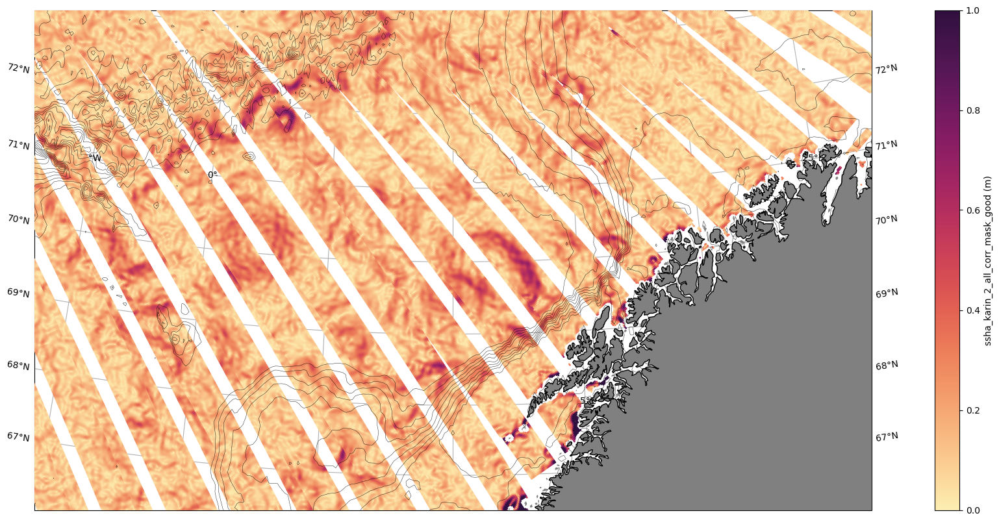

In [13]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 25, 66, 73], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 25, 66, 73], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=1, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 25, 60, 78], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHAI_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 010 - Descending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True)
plt.show()

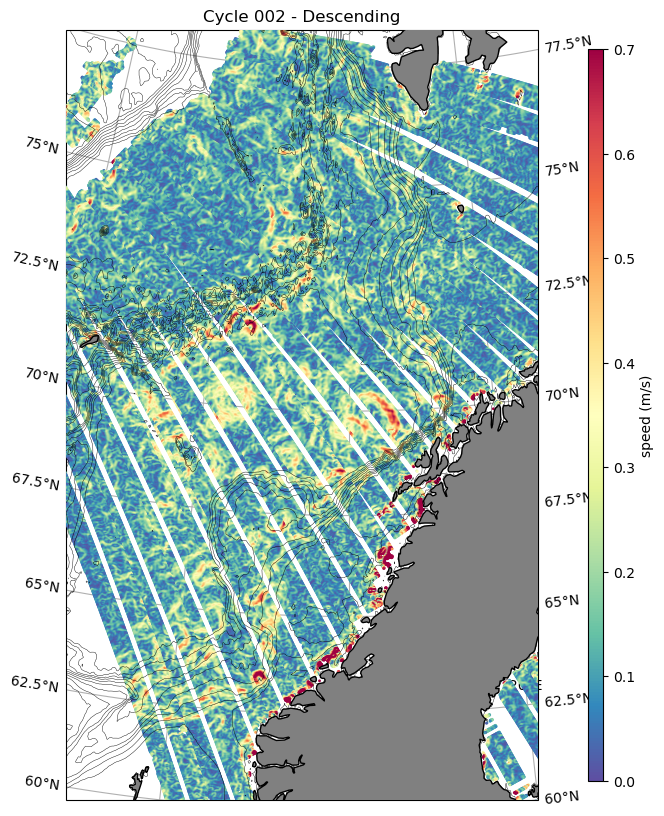

In [46]:
fig = plt.figure(figsize=(13, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 20, 60, 78], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 002 - Descending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True)
plt.show()

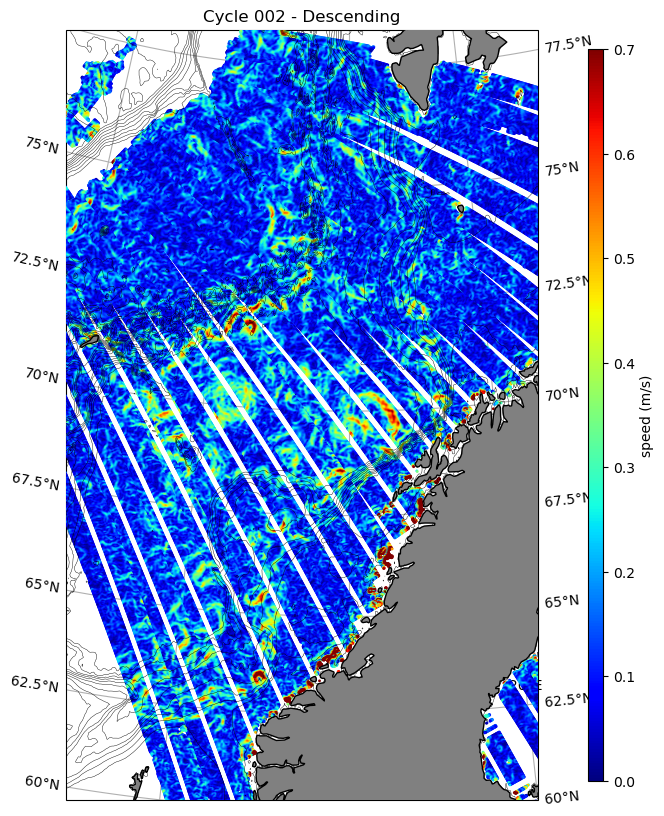

In [44]:
fig = plt.figure(figsize=(13, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 20, 60, 78], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 002 - Descending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True)
plt.show()

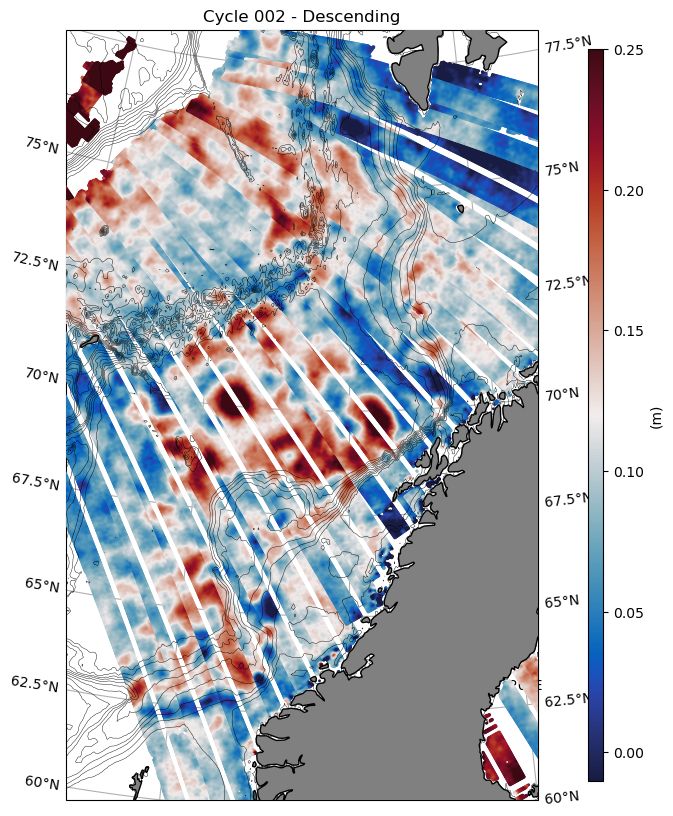

In [45]:
fig = plt.figure(figsize=(13, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 20, 60, 78], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 002 - Descending')
plt.colorbar(a, label='(m)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True)
plt.show()

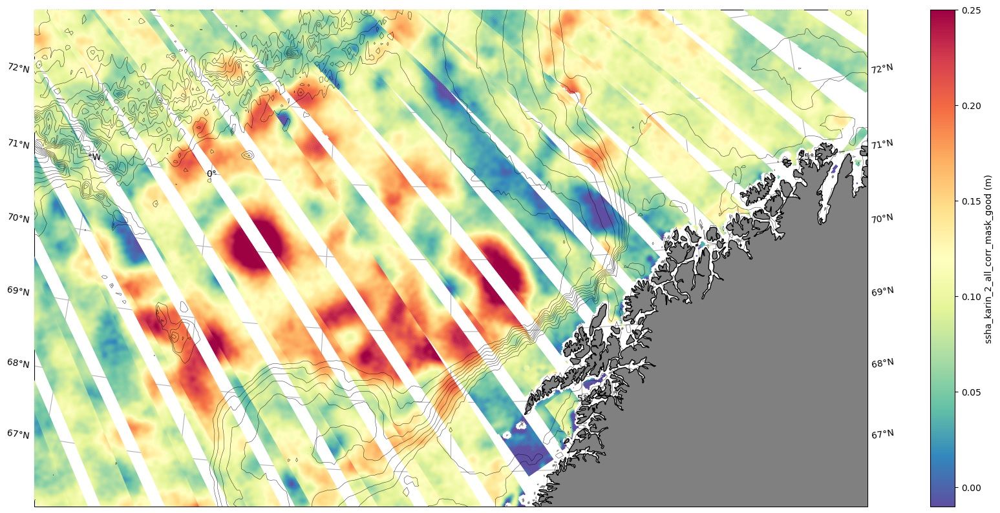

In [14]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 25, 66, 73], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHA'], s=1, cmap='Spectral_r', vmin=-0.01, vmax=0.25, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 25, 66, 73], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHAI_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.6, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 002 - Descending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 23, 60, 78], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())


levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 002 - Descending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 25, 60, 78], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 25, 60, 78], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 002 - Descending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 25, 60, 78], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
h = plt.scatter(df_8_nona['lon'], df_8_nona['lat'], c=df_8_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
i = plt.scatter(df_9_nona['lon'], df_9_nona['lat'], c=df_9_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
j = plt.scatter(df_10_nona['lon'], df_10_nona['lat'], c=df_10_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
k = plt.scatter(df_11_nona['lon'], df_11_nona['lat'], c=df_11_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
l = plt.scatter(df_12_nona['lon'], df_12_nona['lat'], c=df_12_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
m = plt.scatter(df_13_nona['lon'], df_13_nona['lat'], c=df_13_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
n = plt.scatter(df_14_nona['lon'], df_14_nona['lat'], c=df_14_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
o = plt.scatter(df_15_nona['lon'], df_15_nona['lat'], c=df_15_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
p = plt.scatter(df_16_nona['lon'], df_16_nona['lat'], c=df_16_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
q = plt.scatter(df_17_nona['lon'], df_17_nona['lat'], c=df_17_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
r = plt.scatter(df_18_nona['lon'], df_18_nona['lat'], c=df_18_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
s = plt.scatter(df_19_nona['lon'], df_19_nona['lat'], c=df_19_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
t = plt.scatter(df_20_nona['lon'], df_20_nona['lat'], c=df_20_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
u = plt.scatter(df_21_nona['lon'], df_21_nona['lat'], c=df_21_nona['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
df_1 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_531_cyc_005'+'*.csv')], ignore_index=True)
df_1_nona = df_1.dropna(axis=0)

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 25, 60, 80], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
df_1 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_003_cyc_005'+'*.csv')], ignore_index=True)
df_2 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_059_cyc_005'+'*.csv')], ignore_index=True)
df_3 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_115_cyc_005'+'*.csv')], ignore_index=True)
df_4 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_199_cyc_005'+'*.csv')], ignore_index=True)
df_5 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_201_cyc_005'+'*.csv')], ignore_index=True)
df_6 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_225_cyc_005'+'*.csv')], ignore_index=True)
df_7 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + 'pass_281_cyc_005'+'*.csv')], ignore_index=True)

In [ ]:
df_1_nona = df_1.dropna(axis=0)
df_2_nona = df_2.dropna(axis=0)
df_3_nona = df_3.dropna(axis=0)
df_4_nona = df_4.dropna(axis=0)
df_5_nona = df_5.dropna(axis=0)
df_6_nona = df_6.dropna(axis=0)
df_7_nona = df_7.dropna(axis=0)

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=10))
ax.set_extent([-5, 25, 60, 80], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_1_nona['lon'], df_1_nona['lat'], c=df_1_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
b = plt.scatter(df_2_nona['lon'], df_2_nona['lat'], c=df_2_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
c = plt.scatter(df_3_nona['lon'], df_3_nona['lat'], c=df_3_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
d = plt.scatter(df_4_nona['lon'], df_4_nona['lat'], c=df_4_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
e = plt.scatter(df_5_nona['lon'], df_5_nona['lat'], c=df_5_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
f = plt.scatter(df_6_nona['lon'], df_6_nona['lat'], c=df_6_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
g = plt.scatter(df_7_nona['lon'], df_7_nona['lat'], c=df_7_nona['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())

levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [15]:
LABAS01 =['pass_014', 'pass_016', 'pass_018', 'pass_044', 'pass_046', 'pass_070', 'pass_072', 'pass_074', 'pass_100',
          'pass_126', 'pass_128', 'pass_154', 'pass_156', 'pass_182', 'pass_184', 'pass_208', 'pass_210', 'pass_212',
          'pass_238', 'pass_240', 'pass_266', 'pass_268']

LABAS02 =['pass_292', 'pass_294', 'pass_296', 'pass_322', 'pass_324', 'pass_348', 'pass_350', 'pass_352',
          'pass_376', 'pass_378', 'pass_404', 'pass_406', 'pass_432', 'pass_434', 'pass_460', 'pass_462', 
          'pass_488', 'pass_490', 'pass_516', 'pass_518', 'pass_544', 'pass_546', 'pass_572', 'pass_574']

LABDE01 =['pass_005', 'pass_007', 'pass_009', 'pass_031', 'pass_033', 'pass_035', 'pass_037', 'pass_059', 'pass_061', 'pass_063', 
          'pass_115', 'pass_117', 'pass_119', 'pass_143', 'pass_145', 'pass_147', 'pass_171', 'pass_173', 'pass_175', 
          'pass_199', 'pass_201', 'pass_203', 'pass_227', 'pass_229', 'pass_231', 'pass_255', 'pass_257', 'pass_259']

LABDE02 =['pass_283', 'pass_285', 'pass_287', 'pass_311', 'pass_313', 'pass_337', 'pass_339', 'pass_341', 
          'pass_365', 'pass_367', 'pass_369', 'pass_393', 'pass_395', 'pass_397', 'pass_421', 'pass_423', 'pass_425', 
          'pass_449', 'pass_451', 'pass_453', 'pass_477', 'pass_479', 'pass_481', 'pass_505', 'pass_507', 'pass_509', 
          'pass_533', 'pass_535', ] #'pass_561', 'pass_563', 'pass_565'

In [17]:
#csv_name = 'pass_*'+'_202312'+'*.csv'
save_to_csv = '/uio/hypatia/geofag-personlig/students/metos/ingvilob/A_speed_csv_2/'#+csv_name
csv_name = '_202312'
csv_name = '002'

In [18]:
df_01 = pd.DataFrame()
df_02 = pd.DataFrame()
df_03 = pd.DataFrame()
df_04 = pd.DataFrame()
df_05 = pd.DataFrame()
df_06 = pd.DataFrame()
df_07 = pd.DataFrame()
df_08 = pd.DataFrame()
df_09 = pd.DataFrame()
df_10 = pd.DataFrame()
df_11 = pd.DataFrame()
df_12 = pd.DataFrame()
df_13 = pd.DataFrame()
df_14 = pd.DataFrame()
df_15 = pd.DataFrame()
df_16 = pd.DataFrame()
df_17 = pd.DataFrame()
df_18 = pd.DataFrame()
df_19 = pd.DataFrame()
df_20 = pd.DataFrame()
df_21 = pd.DataFrame()
df_22 = pd.DataFrame()

if glob.glob(save_to_csv + LABAS01[0] + '_cyc*'+csv_name+'*.csv') != []:
    df_01 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[0] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[1] + '_cyc*'+csv_name+'*.csv') != []:
    df_02 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[1] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[2] + '_cyc*'+csv_name+'*.csv') != []:
    df_03 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[2] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[3] + '_cyc*'+csv_name+'*.csv') != []:
    df_04 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[3] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[4] + '_cyc*'+csv_name+'*.csv') != []:
    df_05 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[4] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[5] + '_cyc*'+csv_name+'*.csv') != []:
    df_06 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[5] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[6] + '_cyc*'+csv_name+'*.csv') != []:
    df_07 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[6] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[7] + '_cyc*'+csv_name+'*.csv') != []:
    df_08 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[7] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[8] + '_cyc*'+csv_name+'*.csv') != []:
    df_09 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[8] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[9] + '_cyc*'+csv_name+'*.csv') != []:
    df_10 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[9] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[10] + '_cyc*'+csv_name+'*.csv') != []:
    df_11 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[10] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[11] + '_cyc*'+csv_name+'*.csv') != []:
    df_12 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[11] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[12] + '_cyc*'+csv_name+'*.csv') != []:
    df_13 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[12] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[13] + '_cyc*'+csv_name+'*.csv') != []:
    df_14 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[13] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[14] + '_cyc*'+csv_name+'*.csv') != []:
    df_15 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[14] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[15] + '_cyc*'+csv_name+'*.csv') != []:
    df_16 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[15] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[16] + '_cyc*'+csv_name+'*.csv') != []:
    df_17 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[16] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[17] + '_cyc*'+csv_name+'*.csv') != []:
    df_18 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[17] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[18] + '_cyc*'+csv_name+'*.csv') != []:
    df_19 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[18] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[19] + '_cyc*'+csv_name+'*.csv') != []:
    df_20 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[19] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[20] + '_cyc*'+csv_name+'*.csv') != []:
    df_21 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[20] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS01[21] + '_cyc*'+csv_name+'*.csv') != []:
    df_22 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS01[21] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)


df_LABAS01 = pd.concat([df_01,df_02,df_03,df_04,df_05,df_06,df_07,df_08,df_09,df_10,df_11,df_12,df_13,df_14,df_15,df_16,df_17,df_18,df_19,df_20,df_21,df_22], ignore_index=True)


In [19]:
df_01 = pd.DataFrame()
df_02 = pd.DataFrame()
df_03 = pd.DataFrame()
df_04 = pd.DataFrame()
df_05 = pd.DataFrame()
df_06 = pd.DataFrame()
df_07 = pd.DataFrame()
df_08 = pd.DataFrame()
df_09 = pd.DataFrame()
df_10 = pd.DataFrame()
df_11 = pd.DataFrame()
df_12 = pd.DataFrame()
df_13 = pd.DataFrame()
df_14 = pd.DataFrame()
df_15 = pd.DataFrame()
df_16 = pd.DataFrame()
df_17 = pd.DataFrame()
df_18 = pd.DataFrame()
df_19 = pd.DataFrame()
df_20 = pd.DataFrame()
df_21 = pd.DataFrame()
df_22 = pd.DataFrame()
df_23 = pd.DataFrame()
df_24 = pd.DataFrame()

if glob.glob(save_to_csv + LABAS02[0] + '_cyc*'+csv_name+'*.csv') != []:
    df_01 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[0] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[1] + '_cyc*'+csv_name+'*.csv') != []:
    df_02 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[1] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[2] + '_cyc*'+csv_name+'*.csv') != []:
    df_03 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[2] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[3] + '_cyc*'+csv_name+'*.csv') != []:
    df_04 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[3] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[4] + '_cyc*'+csv_name+'*.csv') != []:
    df_05 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[4] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[5] + '_cyc*'+csv_name+'*.csv') != []:
    df_06 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[5] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[6] + '_cyc*'+csv_name+'*.csv') != []:
    df_07 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[6] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[7] + '_cyc*'+csv_name+'*.csv') != []:
    df_08 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[7] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[8] + '_cyc*'+csv_name+'*.csv') != []:
    df_09 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[8] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[9] + '_cyc*'+csv_name+'*.csv') != []:
    df_10 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[9] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[10] + '_cyc*'+csv_name+'*.csv') != []:
    df_11 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[10] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[11] + '_cyc*'+csv_name+'*.csv') != []:
    df_12 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[11] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[12] + '_cyc*'+csv_name+'*.csv') != []:
    df_13 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[12] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[13] + '_cyc*'+csv_name+'*.csv') != []:
    df_14 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[13] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[14] + '_cyc*'+csv_name+'*.csv') != []:
    df_15 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[14] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[15] + '_cyc*'+csv_name+'*.csv') != []:
    df_16 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[15] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[16] + '_cyc*'+csv_name+'*.csv') != []:
    df_17 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[16] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[17] + '_cyc*'+csv_name+'*.csv') != []:
    df_18 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[17] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[18] + '_cyc*'+csv_name+'*.csv') != []:
    df_19 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[18] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[19] + '_cyc*'+csv_name+'*.csv') != []:
    df_20 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[19] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[20] + '_cyc*'+csv_name+'*.csv') != []:
    df_21 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[20] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[21] + '_cyc*'+csv_name+'*.csv') != []:
    df_22 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[21] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[22] + '_cyc*'+csv_name+'*.csv') != []:
    df_23 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[22] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABAS02[23] + '_cyc*'+csv_name+'*.csv') != []:
    df_24 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABAS02[23] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)


df_LABAS02 = pd.concat([df_01,df_02,df_03,df_04,df_05,df_06,df_07,df_08,df_09,df_10,df_11,df_12,df_13,df_14,df_15,df_16,df_17,df_18,df_19,df_20,df_21,df_22,df_23,df_24], ignore_index=True)


In [20]:
df_01 = pd.DataFrame()
df_02 = pd.DataFrame()
df_03 = pd.DataFrame()
df_04 = pd.DataFrame()
df_05 = pd.DataFrame()
df_06 = pd.DataFrame()
df_07 = pd.DataFrame()
df_08 = pd.DataFrame()
df_09 = pd.DataFrame()
df_10 = pd.DataFrame()
df_11 = pd.DataFrame()
df_12 = pd.DataFrame()
df_13 = pd.DataFrame()
df_14 = pd.DataFrame()
df_15 = pd.DataFrame()
df_16 = pd.DataFrame()
df_17 = pd.DataFrame()
df_18 = pd.DataFrame()
df_19 = pd.DataFrame()
df_20 = pd.DataFrame()
df_21 = pd.DataFrame()
df_22 = pd.DataFrame()
df_23 = pd.DataFrame()
df_24 = pd.DataFrame()
df_25 = pd.DataFrame()
df_26 = pd.DataFrame()
df_27 = pd.DataFrame()
df_28 = pd.DataFrame()

if glob.glob(save_to_csv + LABDE01[0] + '_cyc*'+csv_name+'*.csv') != []:
    df_01 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[0] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[1] + '_cyc*'+csv_name+'*.csv') != []:
    df_02 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[1] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[2] + '_cyc*'+csv_name+'*.csv') != []:
    df_03 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[2] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[3] + '_cyc*'+csv_name+'*.csv') != []:
    df_04 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[3] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[4] + '_cyc*'+csv_name+'*.csv') != []:
    df_05 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[4] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[5] + '_cyc*'+csv_name+'*.csv') != []:
    df_06 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[5] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[6] + '_cyc*'+csv_name+'*.csv') != []:
    df_07 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[6] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[7] + '_cyc*'+csv_name+'*.csv') != []:
    df_08 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[7] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[8] + '_cyc*'+csv_name+'*.csv') != []:
    df_09 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[8] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[9] + '_cyc*'+csv_name+'*.csv') != []:
    df_10 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[9] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[10] + '_cyc*'+csv_name+'*.csv') != []:
    df_11 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[10] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[11] + '_cyc*'+csv_name+'*.csv') != []:
    df_12 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[11] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[12] + '_cyc*'+csv_name+'*.csv') != []:
    df_13 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[12] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[13] + '_cyc*'+csv_name+'*.csv') != []:
    df_14 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[13] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[14] + '_cyc*'+csv_name+'*.csv') != []:
    df_15 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[14] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[15] + '_cyc*'+csv_name+'*.csv') != []:
    df_16 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[15] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[16] + '_cyc*'+csv_name+'*.csv') != []:
    df_17 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[16] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[17] + '_cyc*'+csv_name+'*.csv') != []:
    df_18 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[17] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[18] + '_cyc*'+csv_name+'*.csv') != []:
    df_19 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[18] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[19] + '_cyc*'+csv_name+'*.csv') != []:
    df_20 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[19] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[20] + '_cyc*'+csv_name+'*.csv') != []:
    df_21 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[20] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[21] + '_cyc*'+csv_name+'*.csv') != []:
    df_22 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[21] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[22] + '_cyc*'+csv_name+'*.csv') != []:
    df_23 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[22] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[23] + '_cyc*'+csv_name+'*.csv') != []:
    df_24 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[23] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[24] + '_cyc*'+csv_name+'*.csv') != []:
    df_25 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[24] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[25] + '_cyc*'+csv_name+'*.csv') != []:
    df_26 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[25] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[26] + '_cyc*'+csv_name+'*.csv') != []:
    df_27 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[26] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE01[27] + '_cyc*'+csv_name+'*.csv') != []:
    df_28 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE01[27] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)


df_LABDE01 = pd.concat([df_01,df_02,df_03,df_04,df_05,df_06,df_07,df_08,df_09,df_10,df_11,df_12,df_13,df_14,df_15,df_16,df_17,df_18,df_19,df_20,df_21,df_22,df_23,df_24,df_25,df_26,df_27,df_28], ignore_index=True)


In [21]:
df_01 = pd.DataFrame()
df_02 = pd.DataFrame()
df_03 = pd.DataFrame()
df_04 = pd.DataFrame()
df_05 = pd.DataFrame()
df_06 = pd.DataFrame()
df_07 = pd.DataFrame()
df_08 = pd.DataFrame()
df_09 = pd.DataFrame()
df_10 = pd.DataFrame()
df_11 = pd.DataFrame()
df_12 = pd.DataFrame()
df_13 = pd.DataFrame()
df_14 = pd.DataFrame()
df_15 = pd.DataFrame()
df_16 = pd.DataFrame()
df_17 = pd.DataFrame()
df_18 = pd.DataFrame()
df_19 = pd.DataFrame()
df_20 = pd.DataFrame()
df_21 = pd.DataFrame()
df_22 = pd.DataFrame()
df_23 = pd.DataFrame()
df_24 = pd.DataFrame()
df_25 = pd.DataFrame()
df_26 = pd.DataFrame()
df_27 = pd.DataFrame()
df_28 = pd.DataFrame()

if glob.glob(save_to_csv + LABDE02[0] + '_cyc*'+csv_name+'*.csv') != []:
    df_01 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[0] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[1] + '_cyc*'+csv_name+'*.csv') != []:
    df_02 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[1] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[2] + '_cyc*'+csv_name+'*.csv') != []:
    df_03 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[2] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[3] + '_cyc*'+csv_name+'*.csv') != []:
    df_04 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[3] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[4] + '_cyc*'+csv_name+'*.csv') != []:
    df_05 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[4] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[5] + '_cyc*'+csv_name+'*.csv') != []:
    df_06 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[5] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[6] + '_cyc*'+csv_name+'*.csv') != []:
    df_07 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[6] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[7] + '_cyc*'+csv_name+'*.csv') != []:
    df_08 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[7] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[8] + '_cyc*'+csv_name+'*.csv') != []:
    df_09 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[8] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[9] + '_cyc*'+csv_name+'*.csv') != []:
    df_10 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[9] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[10] + '_cyc*'+csv_name+'*.csv') != []:
    df_11 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[10] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[11] + '_cyc*'+csv_name+'*.csv') != []:
    df_12 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[11] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[12] + '_cyc*'+csv_name+'*.csv') != []:
    df_13 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[12] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[13] + '_cyc*'+csv_name+'*.csv') != []:
    df_14 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[13] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[14] + '_cyc*'+csv_name+'*.csv') != []:
    df_15 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[14] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[15] + '_cyc*'+csv_name+'*.csv') != []:
    df_16 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[15] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[16] + '_cyc*'+csv_name+'*.csv') != []:
    df_17 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[16] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[17] + '_cyc*'+csv_name+'*.csv') != []:
    df_18 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[17] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[18] + '_cyc*'+csv_name+'*.csv') != []:
    df_19 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[18] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[19] + '_cyc*'+csv_name+'*.csv') != []:
    df_20 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[19] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[20] + '_cyc*'+csv_name+'*.csv') != []:
    df_21 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[20] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[21] + '_cyc*'+csv_name+'*.csv') != []:
    df_22 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[21] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[22] + '_cyc*'+csv_name+'*.csv') != []:
    df_23 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[22] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[23] + '_cyc*'+csv_name+'*.csv') != []:
    df_24 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[23] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[24] + '_cyc*'+csv_name+'*.csv') != []:
    df_25 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[24] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[25] + '_cyc*'+csv_name+'*.csv') != []:
    df_26 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[25] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[26] + '_cyc*'+csv_name+'*.csv') != []:
    df_27 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[26] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)
if glob.glob(save_to_csv + LABDE02[27] + '_cyc*'+csv_name+'*.csv') != []:
    df_28 = pd.concat([pd.read_csv(f) for f in glob.glob(save_to_csv + LABDE02[27] + '_cyc*'+csv_name+'*.csv')], ignore_index=True)


df_LABDE02 = pd.concat([df_01,df_02,df_03,df_04,df_05,df_06,df_07,df_08,df_09,df_10,df_11,df_12,df_13,df_14,df_15,df_16,df_17,df_18,df_19,df_20,df_21,df_22,df_23,df_24,df_25,df_26,df_27,df_28], ignore_index=True)


In [22]:
df_LABAS01_nona = df_LABAS01.dropna(axis=0)
df_LABAS02_nona = df_LABAS02.dropna(axis=0)
df_LABDE01_nona = df_LABDE01.dropna(axis=0)
df_LABDE02_nona = df_LABDE02.dropna(axis=0)

In [23]:
df_LABAS01_nona_cut  = crop_data_to_lat_lon(df_LABAS01_nona, 54, 70, -61.5, -5)
df_LABAS02_nona_cut  = crop_data_to_lat_lon(df_LABAS02_nona, 54, 70, -61.5, -5)
df_LABDE01_nona_cut  = crop_data_to_lat_lon(df_LABDE01_nona, 54, 70, -61.5, -5)
df_LABDE02_nona_cut  = crop_data_to_lat_lon(df_LABDE02_nona, 54, 70, -61.5, -5)

In [ ]:
#listoffiles = glob.glob(save_to_csv + 'pass_*1_cyc_*'+'007_time_20231212'+'*.csv')#glob.glob(save_to_csv)
#listoffiles

In [ ]:
# descending_dec_23 = get_ascending_or_descending_data_csv(save_to_csv, csv_name, 'descending')
# ascending_dec_23  = get_ascending_or_descending_data_csv(save_to_csv, csv_name, 'ascending')
# descending_dec_23_nonan = descending_dec_23.dropna(axis=0)
# ascending_dec_23_nonan  = ascending_dec_23.dropna(axis=0)
# descending_dec_23_nonan_cut = crop_data_to_lat_lon(descending_dec_23_nonan, 54, 70, -61.5, -21)
# ascending_dec_23_nonan_cut  = crop_data_to_lat_lon(ascending_dec_23_nonan, 54, 70, -61.5, -21)

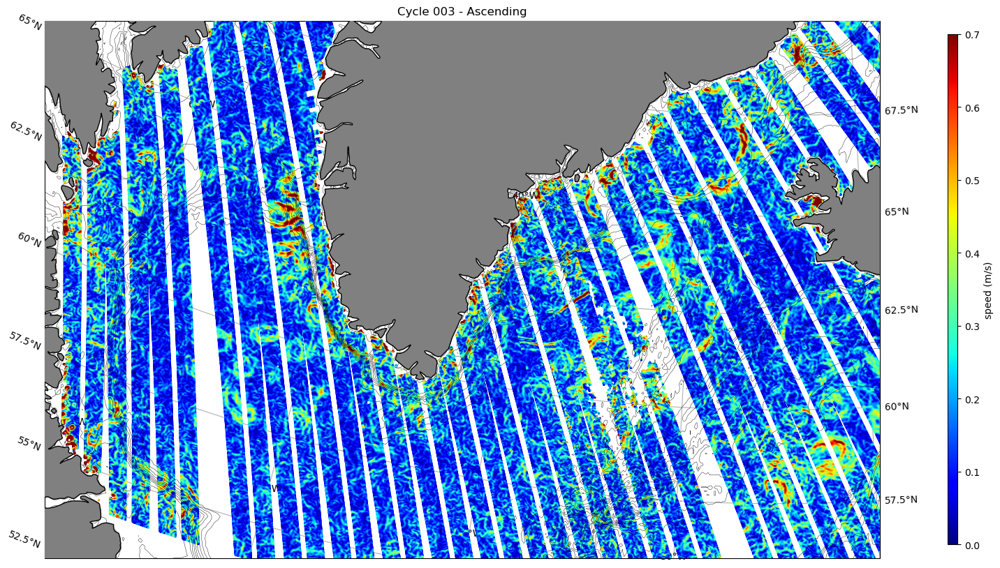

In [32]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -20, 56, 67], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABAS01_nona_cut['lon'], df_LABAS01_nona_cut['lat'], c=df_LABAS01_nona_cut['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 003 - Ascending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True, zorder=15)
plt.show()

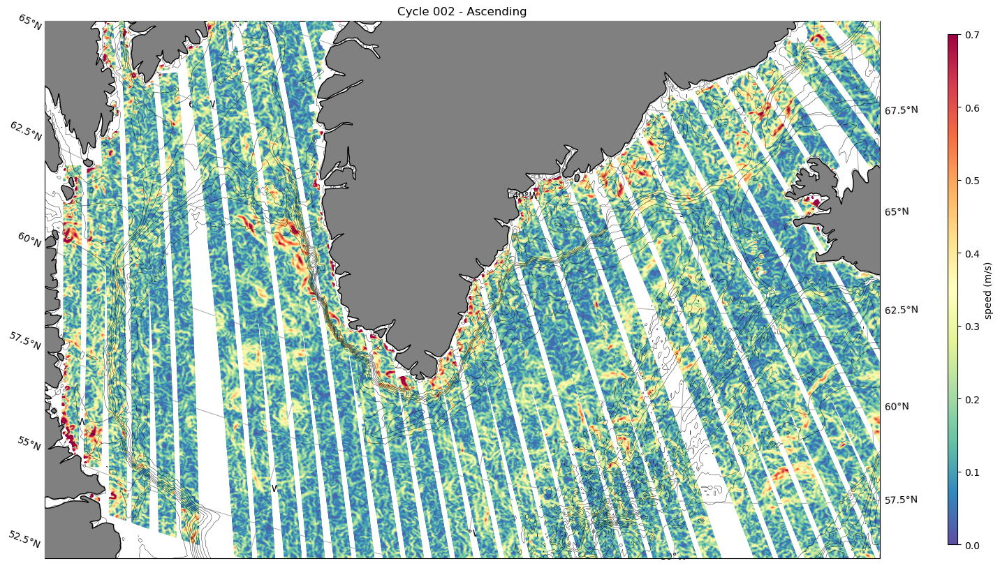

In [24]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -20, 56, 67], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABAS01_nona_cut['lon'], df_LABAS01_nona_cut['lat'], c=df_LABAS01_nona_cut['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 002 - Ascending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True, zorder=15)
plt.show()

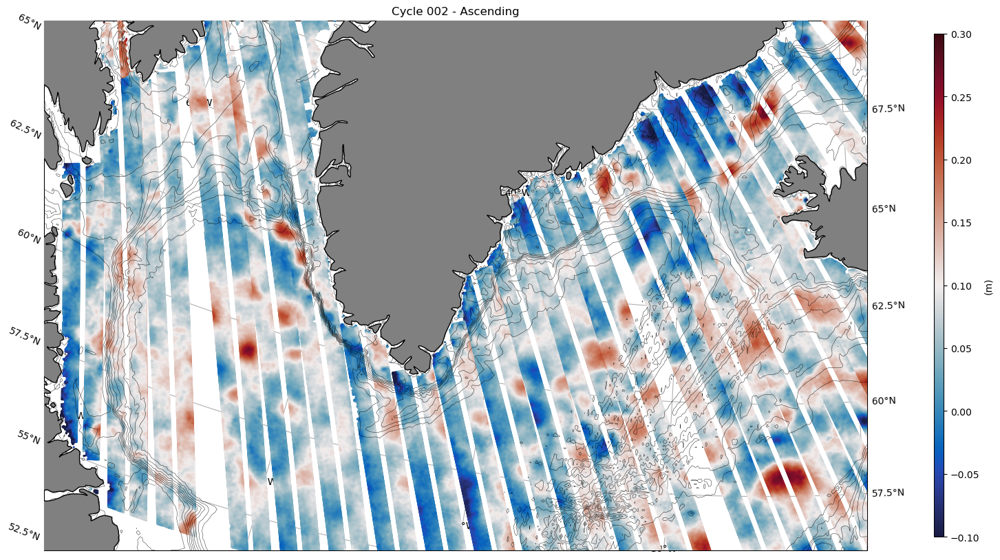

In [25]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -20, 56, 67], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABAS01_nona_cut['lon'], df_LABAS01_nona_cut['lat'], c=df_LABAS01_nona_cut['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 002 - Ascending')
plt.colorbar(a, label='(m)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True, zorder=15)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -32, 56, 64], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 003 - Ascending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True, zorder=15)
plt.show()

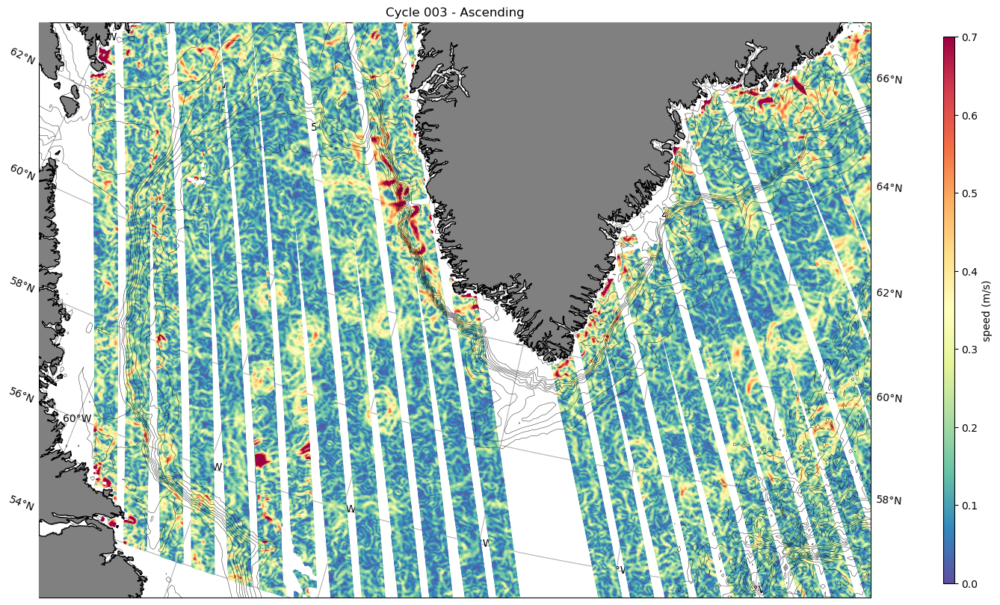

In [18]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -32, 56, 64], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=0.7, zorder=10, transform=ccrs.PlateCarree())
levels = np.linspace(-2500, 0, 10)
plt.contour(bath_for_plot_NorLab['lon'], bath_for_plot_NorLab['lat'], bath_for_plot_NorLab['z'], levels=levels, colors='black', linestyles='solid', linewidths=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 003 - Ascending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True, zorder=15)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -32, 56, 64], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHAI'], s=1, cmap=cmocean.cm.balance, vmin=-0.15, vmax=0.2, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='speed (m/s)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -32, 56, 64], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.1, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.title('Cycle 003 - Ascending')
plt.colorbar(a, label='speed (m/s)', aspect=50, shrink=0.95) #, fraction=0.05, pad=0.005, 
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -32, 56, 64], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA'], s=1, cmap='Spectral_r', vmin=-0.15, vmax=0.15, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='speed (m/s)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -32, 56, 64], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='speed (m/s)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABAS01_nona_cut['lon'], df_LABAS01_nona_cut['lat'], c=df_LABAS01_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABAS01_nona_cut['lon'], df_LABAS01_nona_cut['lat'], c=df_LABAS01_nona_cut['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
#a = plt.scatter(df_LABAS01_nona_cut['lon'], df_LABAS01_nona_cut['lat'], c=df_LABAS01_nona_cut['SSHA_SPEED'], s=1, cmap='Spectral_r', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='speed (m/s)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABAS02_nona_cut['lon'], df_LABAS02_nona_cut['lat'], c=df_LABAS02_nona_cut['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABDE01_nona_cut['lon'], df_LABDE01_nona_cut['lat'], c=df_LABDE01_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABDE01_nona_cut['lon'], df_LABDE01_nona_cut['lat'], c=df_LABDE01_nona_cut['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
#a = plt.scatter(df_LABDE02_nona_cut['lon'], df_LABDE02_nona_cut['lat'], c=df_LABDE02_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
a = plt.scatter(df_LABDE02_nona_cut['lon'], df_LABDE02_nona_cut['lat'], c=df_LABDE02_nona_cut['SSHA_SPEED'], s=1, cmap='jet', vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())

plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_ascending_nona_cut['lon'], df_ascending_nona_cut['lat'], c=df_ascending_nona_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
a = plt.scatter(df_ascending_nona_cut['lon'], df_ascending_nona_cut['lat'], c=df_ascending_nona_cut['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.3, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
ax.gridlines(draw_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
ax.gridlines(draw_labels=True)
a = plt.scatter(descending_dec_23_nonan_cut['lon'], descending_dec_23_nonan_cut['lat'], c=descending_dec_23_nonan_cut['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.3, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 69], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
ax.gridlines(draw_labels=True)
a = plt.scatter(ascending_dec_23_nonan_cut['lon'], ascending_dec_23_nonan_cut['lat'], c=ascending_dec_23_nonan_cut['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.3, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 69], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
ax.gridlines(draw_labels=True)
a = plt.scatter(ascending_dec_23_nonan_cut['lon'], ascending_dec_23_nonan_cut['lat'], c=ascending_dec_23_nonan_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 69], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
ax.gridlines(draw_labels=True)
a = plt.scatter(ascending_dec_23_nonan_cut['lon'], ascending_dec_23_nonan_cut['lat'], c=ascending_dec_23_nonan_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
ax.gridlines(draw_labels=True)
a = plt.scatter(descending_dec_23_nonan_cut['lon'], descending_dec_23_nonan_cut['lat'], c=descending_dec_23_nonan_cut['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.3, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
ax.gridlines(draw_labels=True)
a = plt.scatter(ascending_dec_23_nonan_cut['lon'], ascending_dec_23_nonan_cut['lat'], c=ascending_dec_23_nonan_cut['SSHA'], s=1, cmap=cmocean.cm.balance, vmin=-0.3, vmax=0.3, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
ax.gridlines(draw_labels=True)
a = plt.scatter(ascending_dec_23_nonan_cut['lon'], ascending_dec_23_nonan_cut['lat'], c=ascending_dec_23_nonan_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
ax.gridlines(draw_labels=True)
a = plt.scatter(descending_dec_23_nonan_cut['lon'], descending_dec_23_nonan_cut['lat'], c=descending_dec_23_nonan_cut['SSHA_SPEED'], s=1, cmap=cmocean.cm.matter_r, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
ax.gridlines(draw_labels=True)
a = plt.scatter(descending_dec_23_nonan_cut['lon'], descending_dec_23_nonan_cut['lat'], c=descending_dec_23_nonan_cut['SSHAI_SPEED'], s=1, cmap=cmocean.cm.matter, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
plt.show()

In [ ]:
fig = plt.figure(figsize=(25, 10))
ax = fig.add_subplot(projection=ccrs.LambertConformal(central_longitude=-25))
ax.set_extent([-61.5, -21, 56, 70], ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, facecolor='grey', zorder=100)
ax.add_feature(cfeature.COASTLINE, zorder=100)
ax.gridlines(draw_labels=True)
a = plt.scatter(descending_dec_23_nonan_cut['lon'], descending_dec_23_nonan_cut['lat'], c=descending_dec_23_nonan_cut['SSHAI_SPEED'], s=1, cmap=cmocean.cm.speed, vmin=0, vmax=1, zorder=10, transform=ccrs.PlateCarree())
plt.colorbar(a, label='ssha_karin_2_all_corr_mask_good (m)')
plt.show()